In [1]:
import pandas as pd
# Load the dataset
df = pd.read_csv('Predicting Child Birth Weight from Maternal Features.csv')

In [2]:
# Display basic information
print(df.head())
print(df.info())
print(df.describe())

   SEC  Age(years)  Height(cm)  Bgroup  Parity  ANC  Iwt(kg)  FWt(kg)  \
0  BPL        23.0       146.0  A(+ve)     1.0  4.0     34.0     42.0   
1  BPL        25.0       165.0     NIL     1.0  3.0     68.0     71.0   
2  BPL        24.0       155.0  B(+ve)     1.0  3.0     49.0     55.0   
3  BPL        19.0       154.0     NIL     1.0  2.0     49.0     50.0   
4  BPL        21.0       150.0     NIL     1.0  4.0     41.0     48.0   

   IBP_sys  IBP_dias  FBP_sys  FBP_dias  IHb(gm%)  FHb(gm%)  BS(RBS)  \
0    116.0      78.0    120.0      70.0      10.0      13.2     90.0   
1     96.0      70.0    110.0      72.0      10.4      11.0     96.0   
2     91.0      52.0    110.0      70.0      11.0      11.6    102.0   
3     90.0      52.0    100.0      60.0      10.0      10.6    103.0   
4    100.0      60.0    110.0      70.0       9.0      10.2     99.0   

  Term/Preterm Sex  BWt(kg)  LNH  
0            T   F      2.7  2.0  
1            T   M      2.9  2.0  
2            T   M     

In [3]:
import numpy as  np
# Replace 'NIL' values with NaN in the 'Bgroup' column
df['Bgroup'] = df['Bgroup'].replace('NIL', np.nan)

# Handle missing values
# For numerical features, fill missing values with the median
df.fillna(df.median(numeric_only=True), inplace=True)

# For categorical features, fill missing values with the mode (most frequent value)
df.fillna(df.mode().iloc[0], inplace=True)

# Remove duplicates
df.drop_duplicates(inplace=True)


In [4]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Define features and target
X = df.drop(columns=['LNH', 'BWt(kg)'])
y_class = df['LNH']  # Classification target
y_reg = df['BWt(kg)']    # Regression target

# Categorical and numerical columns
categorical_features = ['Bgroup', 'Term/Preterm', 'Sex', 'SEC']
numerical_features = X.columns.difference(categorical_features)

# Preprocessing for numerical data
numerical_transformer = StandardScaler()

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Create preprocessing pipelines
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

X_preprocessed = preprocessor.fit_transform(X)
df.to_csv('Optimised Predicting Child Birth Weight from Maternal Features.csv', index=False)


In [5]:
from imblearn.over_sampling import SMOTE
import pandas as pd

# Apply SMOTE to the preprocessed features and the classification target (y_class)
# Set k_neighbors to a lower value (e.g., 1) to handle classes with very few samples
smote = SMOTE(random_state=42, k_neighbors=1)
X_smote, y_smote = smote.fit_resample(X_preprocessed, y_class)

# Print the shape before and after applying SMOTE
print(f'''Shape of X before SMOTE: {X_preprocessed.shape}
Shape of X after SMOTE: {X_smote.shape}''')

# Convert y_smote to a DataFrame to use value_counts and normalize it
y_smote_df = pd.DataFrame(y_smote, columns=['LNH'])

# Print the balance of positive and negative classes in percentages
print('\nBalance of positive and negative classes (%):')
print(y_smote_df['LNH'].value_counts(normalize=True) * 100)

# Save the resampled data to a CSV file
df_smote = pd.DataFrame(X_smote, columns=preprocessor.get_feature_names_out())
df_smote['LNH'] = y_smote
df_smote.to_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv', index=False)


Shape of X before SMOTE: (1792, 28)
Shape of X after SMOTE: (4938, 28)

Balance of positive and negative classes (%):
LNH
2.0    33.333333
1.0    33.333333
3.0    33.333333
Name: proportion, dtype: float64


In [6]:
print(df_smote.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4938 entries, 0 to 4937
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   num__ANC              4938 non-null   float64
 1   num__Age(years)       4938 non-null   float64
 2   num__BS(RBS)          4938 non-null   float64
 3   num__FBP_dias         4938 non-null   float64
 4   num__FBP_sys          4938 non-null   float64
 5   num__FHb(gm%)         4938 non-null   float64
 6   num__FWt(kg)          4938 non-null   float64
 7   num__Height(cm)       4938 non-null   float64
 8   num__IBP_dias         4938 non-null   float64
 9   num__IBP_sys          4938 non-null   float64
 10  num__IHb(gm%)         4938 non-null   float64
 11  num__Iwt(kg)          4938 non-null   float64
 12  num__Parity           4938 non-null   float64
 13  cat__Bgroup_A(+ve)    4938 non-null   float64
 14  cat__Bgroup_A(-ve)    4938 non-null   float64
 15  cat__Bgroup_AB(+ve)  

In [7]:
y_smote.value_counts()

LNH
2.0    1646
1.0    1646
3.0    1646
Name: count, dtype: int64

C:\Users\durup_d9ntfgd\AppData\Local\Temp\ipykernel_18068\723315057.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=y_smote_df, x='LNH', palette='Set2')  # Use a color palette


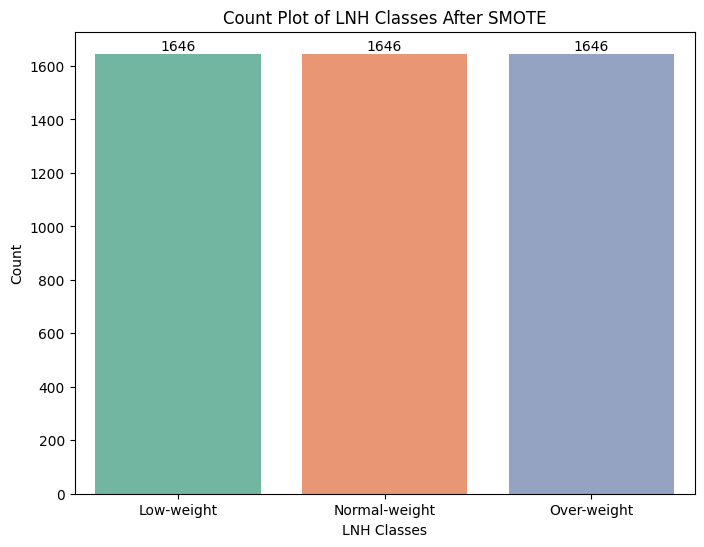

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming y_smote is your target variable after SMOTE
# Convert y_smote to a DataFrame to use value_counts
y_smote_df = pd.DataFrame(y_smote, columns=['LNH'])

# Count Plot of LNH Classes after SMOTE
plt.figure(figsize=(8, 6))
ax = sns.countplot(data=y_smote_df, x='LNH', palette='Set2')  # Use a color palette
plt.title('Count Plot of LNH Classes After SMOTE')
plt.xlabel('LNH Classes')
plt.ylabel('Count')

# Customize x-axis labels
custom_labels = ['Low-weight', 'Normal-weight', 'Over-weight']
ax.set_xticks(range(len(custom_labels)))  # Set tick positions
ax.set_xticklabels(custom_labels, rotation=0, ha='center')  # Set tick labels

# Annotate the bars with their respective counts
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{int(height)}', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='center', 
                xytext=(0, 5), 
                textcoords='offset points')

# Save the figure
plt.savefig('Count_Plot_After_SMOTE.jpg', format='jpg', dpi=300)

# Show the plot
plt.show()


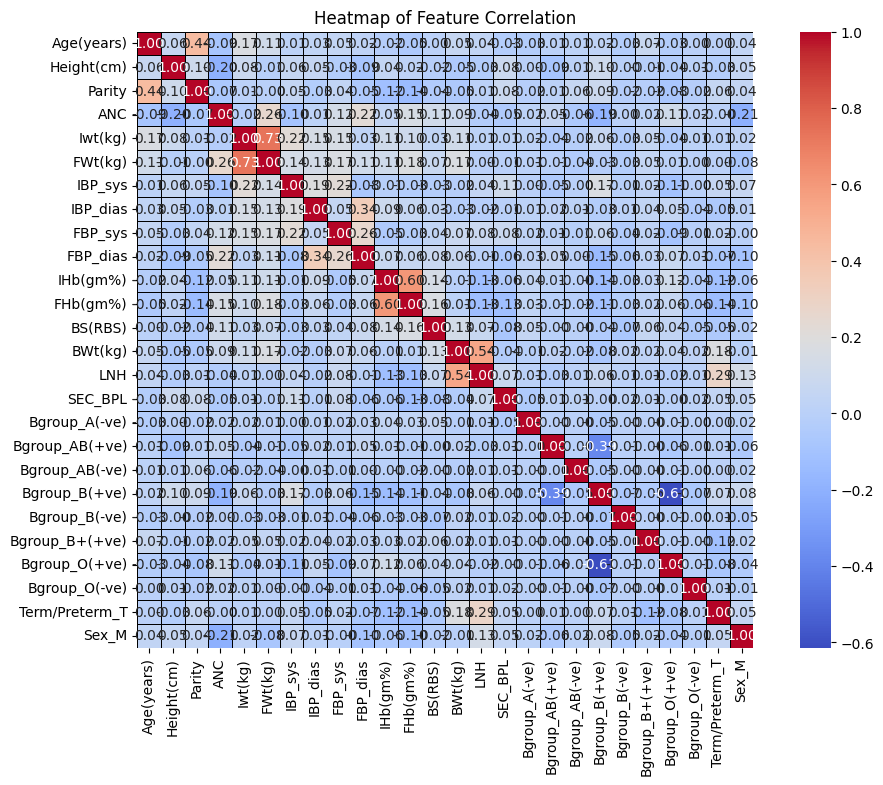

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Load your dataset
# df = pd.read_csv('your_dataset.csv')  # Uncomment this if you're loading a new dataset

# Convert categorical columns to numeric (if applicable)
# Example: Use one-hot encoding or label encoding
df_encoded = pd.get_dummies(df, drop_first=True)  # One-hot encoding for categorical variables

# Compute the correlation matrix (only numeric columns)
correlation_matrix = df_encoded.corr()

# Heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True, cbar=True, 
            linewidths=0.5, linecolor='black')

plt.title('Heatmap of Feature Correlation')
plt.savefig('Feature_Correlation_Heatmap.jpg', format='jpg', dpi=300)
plt.show()


Classification Report:
               precision    recall  f1-score   support

         1.0       0.98      0.94      0.96       309
         2.0       0.94      0.99      0.96       336
         3.0       1.00      1.00      1.00       343

    accuracy                           0.97       988
   macro avg       0.98      0.97      0.97       988
weighted avg       0.98      0.97      0.97       988

Feature Importance Table:
                  Feature    Importance
2           num__BS(RBS)  2.289504e-01
10         num__IHb(gm%)  1.098076e-01
25            cat__Sex_M  8.160694e-02
12           num__Parity  7.579572e-02
6           num__FWt(kg)  6.525350e-02
5          num__FHb(gm%)  5.070746e-02
24            cat__Sex_F  4.848565e-02
1        num__Age(years)  4.219501e-02
7        num__Height(cm)  3.840742e-02
11          num__Iwt(kg)  3.726990e-02
8          num__IBP_dias  3.576244e-02
4           num__FBP_sys  2.799791e-02
3          num__FBP_dias  2.581249e-02
9           num__IBP_s

C:\Users\durup_d9ntfgd\AppData\Local\Temp\ipykernel_18068\664182554.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feature_importance_df, x='Importance', y='Feature', palette='Set2')


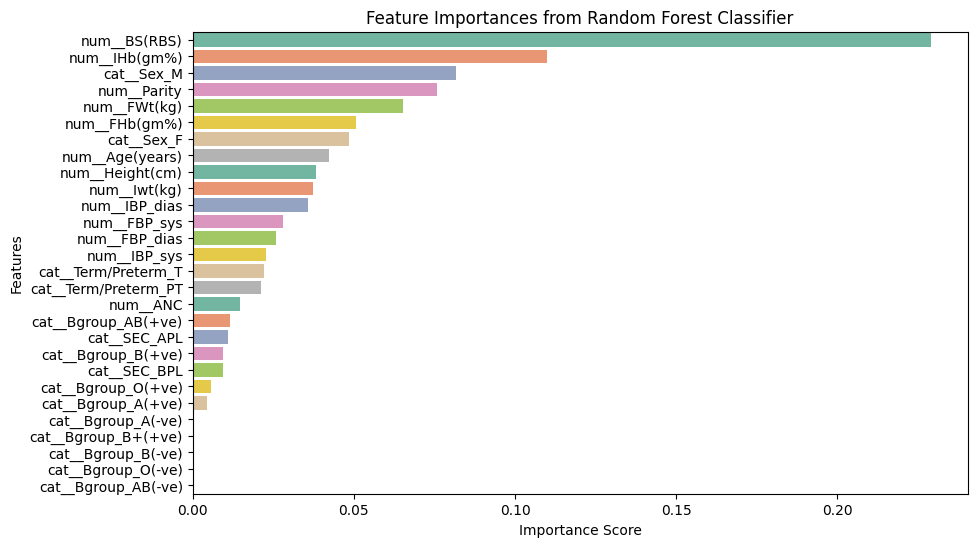

In [10]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Random Forest model
rf_model = RandomForestClassifier(n_jobs=-1, class_weight='balanced', random_state=42)
rf_model.fit(X_train, y_train)

# Predict using the test set
y_pred = rf_model.predict(X_test)

# Print the classification report
print("Classification Report:\n", classification_report(y_test, y_pred))

# Get feature importances from the Random Forest model
importances = rf_model.feature_importances_

# Create a DataFrame to visualize feature importances
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Display Feature Importance Table
print("Feature Importance Table:\n", feature_importance_df)

# Set a threshold for feature selection (e.g., keep features with importance > 0.05)
threshold = 0.05
selected_features = feature_importance_df[feature_importance_df['Importance'] > threshold]['Feature']

# Reduce the original dataset to the selected features
X_train_reduced = X_train[selected_features]
X_test_reduced = X_test[selected_features]

# Train a new Random Forest model with the reduced feature set
rf_model_reduced = RandomForestClassifier(n_jobs=-1, class_weight='balanced', random_state=42)
rf_model_reduced.fit(X_train_reduced, y_train)

# Predict using the reduced feature test set
y_pred_reduced = rf_model_reduced.predict(X_test_reduced)

# Print the classification report for the reduced feature set
print("Classification Report for Reduced Feature Set:\n", classification_report(y_test, y_pred_reduced))

# Plot the feature importances
plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature', palette='Set2')
plt.title('Feature Importances from Random Forest Classifier')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.savefig('Feature_Importances_Random_Forest_SMOTE.jpg', format='jpg', dpi=300)
plt.show()


Classification Report for PCA Reduced Features:
               precision    recall  f1-score   support

         1.0       0.97      1.00      0.98       309
         2.0       1.00      0.97      0.98       336
         3.0       1.00      1.00      1.00       343

    accuracy                           0.99       988
   macro avg       0.99      0.99      0.99       988
weighted avg       0.99      0.99      0.99       988

Feature Importance Table for PCA based on Original Features:
                                    Feature  Contribution
num__Height(cm)            num__Height(cm)  3.264642e+00
num__IBP_sys                  num__IBP_sys  3.135015e+00
cat__Bgroup_A(+ve)      cat__Bgroup_A(+ve)  3.049202e+00
num__Parity                    num__Parity  2.989114e+00
num__FBP_dias                num__FBP_dias  2.913443e+00
num__FBP_sys                  num__FBP_sys  2.900494e+00
cat__Bgroup_O(+ve)      cat__Bgroup_O(+ve)  2.890932e+00
cat__Bgroup_AB(+ve)    cat__Bgroup_AB(+ve)  2.822553

C:\Users\durup_d9ntfgd\AppData\Local\Temp\ipykernel_18068\2004856849.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=importance_df_original, x='Contribution', y='Feature', palette='Set2')


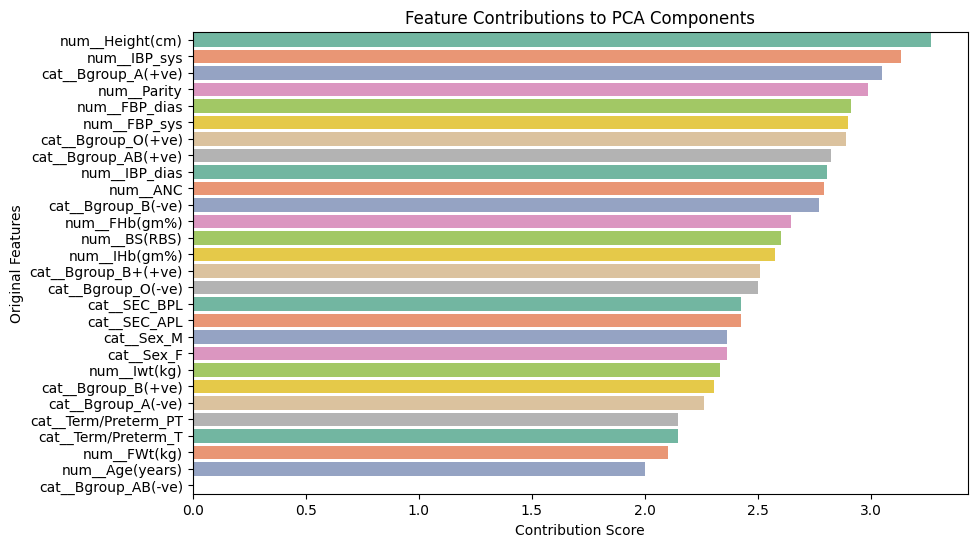

In [11]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset (replace with your actual dataset)
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features for PCA
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply PCA to reduce the number of features
pca = PCA(n_components=0.95)  # Keep 95% of the variance
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Fit a Random Forest model on the PCA reduced features
rf_model_pca = RandomForestClassifier(n_jobs=-1, class_weight='balanced', random_state=42)
rf_model_pca.fit(X_train_pca, y_train)

# Predict using the PCA reduced test set
y_pred_pca = rf_model_pca.predict(X_test_pca)

# Print the classification report for PCA reduced features
print("Classification Report for PCA Reduced Features:\n", classification_report(y_test, y_pred_pca))

# Get feature importances from the Random Forest model with PCA
importances_pca = rf_model_pca.feature_importances_

# Create a DataFrame to show the relationship between original features and PCA components
original_features = X.columns
components_df = pd.DataFrame(pca.components_, columns=original_features)

# Calculate the absolute contribution of each original feature to the PCA components
contributions = np.abs(components_df).sum(axis=0)
importance_df_original = pd.DataFrame({
    'Feature': original_features,
    'Contribution': contributions
}).sort_values(by='Contribution', ascending=False)

# Display Feature Importance Table for PCA based on Original Features
print("Feature Importance Table for PCA based on Original Features:\n", importance_df_original)

# Plotting the feature contributions for PCA components
plt.figure(figsize=(10, 6))
sns.barplot(data=importance_df_original, x='Contribution', y='Feature', palette='Set2')
plt.title('Feature Contributions to PCA Components')
plt.xlabel('Contribution Score')
plt.ylabel('Original Features')
plt.savefig('Feature_Contributions_to_PCA_Random_Forest_SMOTE.jpg', format='jpg', dpi=300)
plt.show()




Selected Features from RFE:
            Feature  Ranking
0  num__Age(years)        1
1     num__BS(RBS)        1
2    num__FHb(gm%)        1
3     num__FWt(kg)        1
4  num__Height(cm)        1
5    num__IHb(gm%)        1
6      num__Parity        1
7       cat__Sex_F        1
Classification Report for Selected Features:
               precision    recall  f1-score   support

         1.0       0.95      0.94      0.94       309
         2.0       0.94      0.96      0.95       336
         3.0       1.00      1.00      1.00       343

    accuracy                           0.97       988
   macro avg       0.97      0.96      0.96       988
weighted avg       0.97      0.97      0.97       988



C:\Users\durup_d9ntfgd\AppData\Local\Temp\ipykernel_18068\291905995.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=selected_features_df, x='Ranking', y='Feature', palette='Set2')


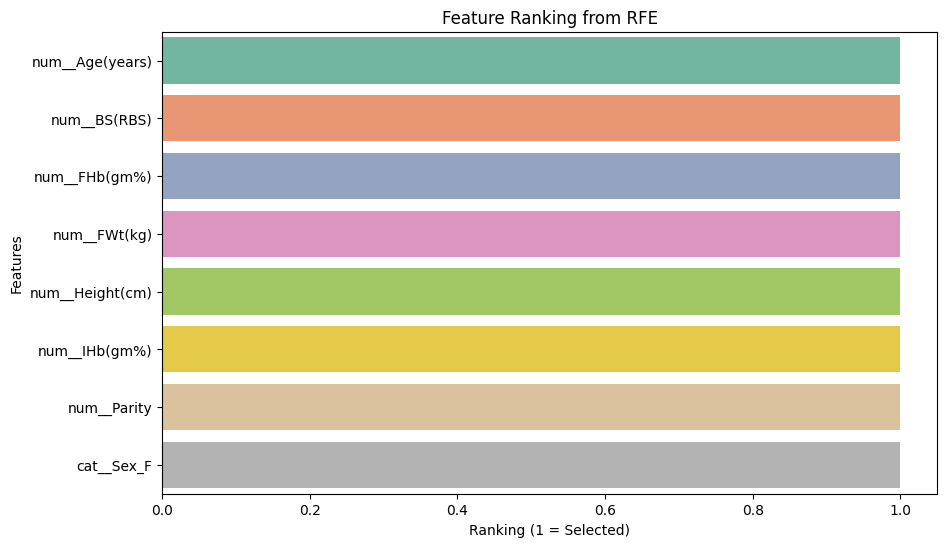

In [12]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset (replace with your actual dataset)
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit RFE using the original features
rf_model_rfe = RandomForestClassifier(n_jobs=-1, class_weight='balanced', random_state=42)  # Initialize Random Forest model
rfe = RFE(estimator=rf_model_rfe, n_features_to_select=8)  # Adjust n_features_to_select as needed
rfe.fit(X_train, y_train)  # Use original X_train

# Get the selected features and their ranking
selected_features = np.array(X.columns)[rfe.support_]
ranking = rfe.ranking_

# Display selected features and their ranking
selected_features_df = pd.DataFrame({'Feature': selected_features, 'Ranking': ranking[rfe.support_]})
print("Selected Features from RFE:\n", selected_features_df)

# Train a Random Forest model using the selected features
X_train_rfe = rfe.transform(X_train)  # Transform training data to selected features
X_test_rfe = rfe.transform(X_test)  # Transform test data to selected features

rf_model_rfe.fit(X_train_rfe, y_train)  # Fit the model on selected features

# Predict using the test set
y_pred_rfe = rf_model_rfe.predict(X_test_rfe)

# Print the classification report for the selected features
print("Classification Report for Selected Features:\n", classification_report(y_test, y_pred_rfe))

# Visualizing RFE ranking
plt.figure(figsize=(10, 6))
sns.barplot(data=selected_features_df, x='Ranking', y='Feature', palette='Set2')
plt.title('Feature Ranking from RFE')
plt.xlabel('Ranking (1 = Selected)')
plt.ylabel('Features')
plt.savefig('RFE_Feature_Ranking_Random_Forest_SMOTE.jpg', format='jpg', dpi=300)
plt.show()


In [13]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])
y = df['LNH']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit RFE using Logistic Regression
log_reg_model_smote = LogisticRegression(max_iter=1000)
rfe = RFE(estimator=log_reg_model_smote, n_features_to_select=10)
rfe.fit(X_train, y_train)

# Transform training and test data
X_train_rfe = rfe.transform(X_train)
X_test_rfe = rfe.transform(X_test)

# Fit the model on selected features
log_reg_model_smote.fit(X_train_rfe, y_train)

# Predict using the test set
y_pred_rfe = log_reg_model_smote.predict(X_test_rfe)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred_rfe)
precision = precision_score(y_test, y_pred_rfe, average='weighted')
recall = recall_score(y_test, y_pred_rfe, average='weighted')
f1 = f1_score(y_test, y_pred_rfe, average='weighted')

# Print the performance metrics
print("Logistic Regression Classifier")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}\n")


Logistic Regression Classifier
Accuracy: 0.7864372469635628
Precision: 0.7849351698803533
Recall: 0.7864372469635628
F1 Score: 0.7856550963080187



In [14]:
from sklearn.tree import DecisionTreeClassifier

# Fit RFE using Decision Tree
tree_model_smote = DecisionTreeClassifier(random_state=42)
rfe = RFE(estimator=tree_model_smote, n_features_to_select=10)
rfe.fit(X_train, y_train)

# Transform training and test data
X_train_rfe = rfe.transform(X_train)
X_test_rfe = rfe.transform(X_test)

# Fit the model on selected features
tree_model_smote.fit(X_train_rfe, y_train)

# Predict using the test set
y_pred_rfe = tree_model_smote.predict(X_test_rfe)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred_rfe)
precision = precision_score(y_test, y_pred_rfe, average='weighted')
recall = recall_score(y_test, y_pred_rfe, average='weighted')
f1 = f1_score(y_test, y_pred_rfe, average='weighted')

# Print the performance metrics
print("Decision Tree Classifier")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}\n")


Decision Tree Classifier
Accuracy: 0.9504048582995951
Precision: 0.9503312285622012
Recall: 0.9504048582995951
F1 Score: 0.9503635727576835



In [15]:
from sklearn.ensemble import RandomForestClassifier

# Fit RFE using Random Forest
rf_model_smote = RandomForestClassifier(random_state=42)
rfe = RFE(estimator=rf_model_smote, n_features_to_select=10)
rfe.fit(X_train, y_train)

# Transform training and test data
X_train_rfe = rfe.transform(X_train)
X_test_rfe = rfe.transform(X_test)

# Fit the model on selected features
rf_model_smote.fit(X_train_rfe, y_train)

# Predict using the test set
y_pred_rfe = rf_model_smote.predict(X_test_rfe)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred_rfe)
precision = precision_score(y_test, y_pred_rfe, average='weighted')
recall = recall_score(y_test, y_pred_rfe, average='weighted')
f1 = f1_score(y_test, y_pred_rfe, average='weighted')

# Print the performance metrics
print("Random Forest Classifier")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}\n")


Random Forest Classifier
Accuracy: 0.9686234817813765
Precision: 0.9686742042806625
Recall: 0.9686234817813765
F1 Score: 0.9686113848396464



In [16]:
from sklearn.ensemble import GradientBoostingClassifier

# Fit RFE using Gradient Boosting
gb_model_smote = GradientBoostingClassifier(random_state=42)
rfe = RFE(estimator=gb_model_smote, n_features_to_select=10)
rfe.fit(X_train, y_train)

# Transform training and test data
X_train_rfe = rfe.transform(X_train)
X_test_rfe = rfe.transform(X_test)

# Fit the model on selected features
gb_model_smote.fit(X_train_rfe, y_train)

# Predict using the test set
y_pred_rfe = gb_model_smote.predict(X_test_rfe)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred_rfe)
precision = precision_score(y_test, y_pred_rfe, average='weighted')
recall = recall_score(y_test, y_pred_rfe, average='weighted')
f1 = f1_score(y_test, y_pred_rfe, average='weighted')

# Print the performance metrics
print("Gradient Boosting Classifier")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}\n")


Gradient Boosting Classifier
Accuracy: 0.9412955465587044
Precision: 0.9415420924213078
Recall: 0.9412955465587044
F1 Score: 0.9411913998356756



In [17]:
from sklearn.svm import SVC

# Fit RFE using SVM with a linear kernel
svm_model_smote = SVC(kernel='linear', random_state=42)
rfe = RFE(estimator=svm_model_smote, n_features_to_select=10)
rfe.fit(X_train, y_train)

# Transform training and test data
X_train_rfe = rfe.transform(X_train)
X_test_rfe = rfe.transform(X_test)

# Fit the model on selected features
svm_model_smote.fit(X_train_rfe, y_train)

# Predict using the test set
y_pred_rfe = svm_model_smote.predict(X_test_rfe)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred_rfe)
precision = precision_score(y_test, y_pred_rfe, average='weighted')
recall = recall_score(y_test, y_pred_rfe, average='weighted')
f1 = f1_score(y_test, y_pred_rfe, average='weighted')

# Print the performance metrics
print("Support Vector Machine Classifier")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}\n")


Support Vector Machine Classifier
Accuracy: 0.7864372469635628
Precision: 0.7853976864529968
Recall: 0.7864372469635628
F1 Score: 0.7858864496461498



In [18]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the KNN model on the entire dataset without RFE
knn_model_smote = KNeighborsClassifier()
knn_model_smote.fit(X_train, y_train)

# Predict using the test set
y_pred = knn_model_smote.predict(X_test)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print the performance metrics
print("K-Nearest Neighbors Classifier")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}\n")



K-Nearest Neighbors Classifier
Accuracy: 0.930161943319838
Precision: 0.9419453558306615
Recall: 0.930161943319838
F1 Score: 0.9293957292883911



In [19]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit RFE using Random Forest to select features
rf_model_smote = RandomForestClassifier(random_state=42)
rfe = RFE(estimator=rf_model_smote, n_features_to_select=10)
rfe.fit(X_train, y_train)

# Transform training and test data using the selected features
X_train_rfe = rfe.transform(X_train)
X_test_rfe = rfe.transform(X_test)

# Fit the Naive Bayes model on the selected features
nb_model_smote = GaussianNB()
nb_model_smote.fit(X_train_rfe, y_train)

# Predict using the test set
y_pred_rfe = nb_model_smote.predict(X_test_rfe)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred_rfe)
precision = precision_score(y_test, y_pred_rfe, average='weighted')
recall = recall_score(y_test, y_pred_rfe, average='weighted')
f1 = f1_score(y_test, y_pred_rfe, average='weighted')

# Print the performance metrics
print("Naive Bayes Classifier")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}\n")




Naive Bayes Classifier
Accuracy: 0.8006072874493927
Precision: 0.7992797491591048
Recall: 0.8006072874493927
F1 Score: 0.7995918324412186



The best model is: Random Forest
Performance metrics:
Accuracy: 0.9686234817813765
Precision: 0.9686742042806625
Recall: 0.9686234817813765
F1 Score: 0.9686113848396464


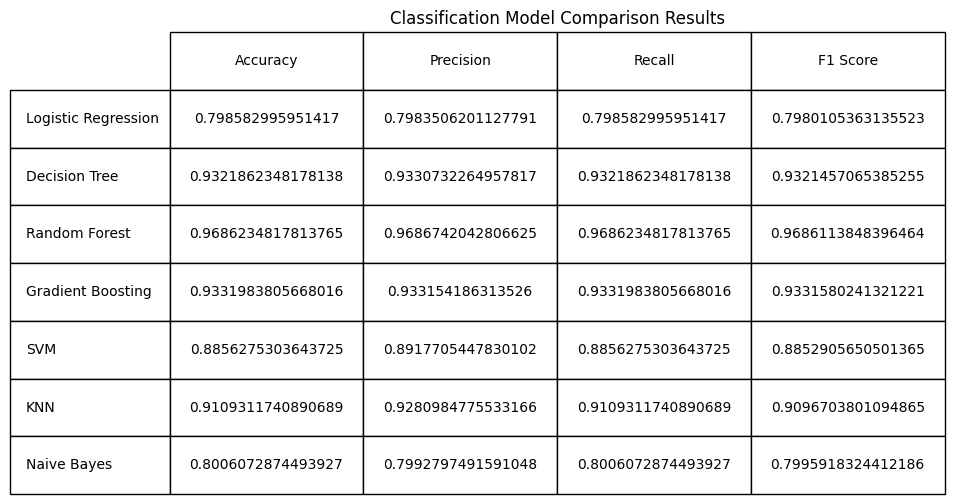

In [20]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import RFE
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize a dictionary to store model results
model_results = {}

# List of classifiers to evaluate
classifiers = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'SVM': SVC(),
    'KNN': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB()
}

# Fit RFE using Random Forest to select features
rf_model_smote = RandomForestClassifier(random_state=42)
rfe = RFE(estimator=rf_model_smote, n_features_to_select=10)
rfe.fit(X_train, y_train)

# Transform training and test data using the selected features
X_train_rfe = rfe.transform(X_train)
X_test_rfe = rfe.transform(X_test)

# Loop through the classifiers, fit each model, and store results
for model_name, model in classifiers.items():
    # Fit the model on the transformed training data
    model.fit(X_train_rfe, y_train)
    
    # Predict using the transformed test set
    y_pred_rfe = model.predict(X_test_rfe)
    
    # Calculate performance metrics
    accuracy = accuracy_score(y_test, y_pred_rfe)
    precision = precision_score(y_test, y_pred_rfe, average='weighted')
    recall = recall_score(y_test, y_pred_rfe, average='weighted')
    f1 = f1_score(y_test, y_pred_rfe, average='weighted')
    
    # Store the results for comparison
    model_results[model_name] = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
    }

# Create a DataFrame to store all metrics for comparison
df_results = pd.DataFrame(model_results).T  # Transpose so that models are rows and metrics are columns

# Determine the best model based on accuracy
best_model = df_results['Accuracy'].idxmax()
best_model_metrics = df_results.loc[best_model]

# Print the best model and its metrics
print(f"The best model is: {best_model}")
print("Performance metrics:")
for metric_name, value in best_model_metrics.items():
    print(f"{metric_name}: {value}")

# Plot and save the results table as a figure
fig, ax = plt.subplots(figsize=(10, 6))  # Set the size of the figure
ax.axis('off')  # Hide the axes
table = ax.table(cellText=df_results.values,
                 rowLabels=df_results.index,
                 colLabels=df_results.columns,
                 cellLoc='center',
                 loc='center',
                 bbox=[0, 0, 1, 1])
plt.title('Classification Model Comparison Results')
plt.savefig('Classification_comparison_results_SMOTE.jpg', format='jpg', bbox_inches='tight')
plt.show()


In [21]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Linear Regression model
linear_reg_smote = LinearRegression()
linear_reg_smote.fit(X_train, y_train)

# Make predictions on the test set
y_pred = linear_reg_smote.predict(X_test)

# Evaluate the model
print("Linear Regression Metrics")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error:", mean_squared_error(y_test, y_pred, squared=False))
print("Mean Absolute Error:", mean_absolute_error(y_test, y_pred))
print("R^2 Score:", r2_score(y_test, y_pred))

# Store the results in a dictionary
lin_reg_results = {
    "MSE": mean_squared_error(y_test, y_pred),
    "RMSE": np.sqrt(mean_squared_error(y_test, y_pred)),
    "MAE": mean_absolute_error(y_test, y_pred),
    "R2 Score": r2_score(y_test, y_pred),
}



Linear Regression Metrics
Mean Squared Error: 0.17138944509043058
Root Mean Squared Error: 0.4139920833668569
Mean Absolute Error: 0.31744030817285485
R^2 Score: 0.7398202567752896


c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [22]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Decision Tree Regression model
dt_reg_smote = DecisionTreeRegressor(random_state=42)
dt_reg_smote.fit(X_train, y_train)

# Make predictions on the test set
y_pred_dt = dt_reg_smote.predict(X_test)

# Evaluate the Decision Tree model
print("Decision Tree Regression Metrics")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred_dt))
print("Root Mean Squared Error:", mean_squared_error(y_test, y_pred_dt, squared=False))
print("Mean Absolute Error:", mean_absolute_error(y_test, y_pred_dt))
print("R^2 Score:", r2_score(y_test, y_pred_dt))


Decision Tree Regression Metrics
Mean Squared Error: 0.053643724696356275
Root Mean Squared Error: 0.2316111497669235
Mean Absolute Error: 0.053643724696356275
R^2 Score: 0.9185655189574197


c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [23]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Random Forest Regression model
rf_reg_smote = RandomForestRegressor(random_state=42)
rf_reg_smote.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = rf_reg_smote.predict(X_test)

# Evaluate the Random Forest model
print("\nRandom Forest Regression Metrics")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred_rf))
print("Root Mean Squared Error:", mean_squared_error(y_test, y_pred_rf, squared=False))
print("Mean Absolute Error:", mean_absolute_error(y_test, y_pred_rf))
print("R^2 Score:", r2_score(y_test, y_pred_rf))



Random Forest Regression Metrics
Mean Squared Error: 0.02819362348178138
Root Mean Squared Error: 0.16790956935738172
Mean Absolute Error: 0.06618421052631579
R^2 Score: 0.9572003415134832


c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [24]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Gradient Boosting Regression model
gb_reg_smote = GradientBoostingRegressor(random_state=42)
gb_reg_smote.fit(X_train, y_train)

# Make predictions on the test set
y_pred_gb = gb_reg_smote.predict(X_test)

# Evaluate the Gradient Boosting model
print("\nGradient Boosting Regression Metrics")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred_gb))
print("Root Mean Squared Error:", mean_squared_error(y_test, y_pred_gb, squared=False))
print("Mean Absolute Error:", mean_absolute_error(y_test, y_pred_gb))
print("R^2 Score:", r2_score(y_test, y_pred_gb))



Gradient Boosting Regression Metrics
Mean Squared Error: 0.04798552703691509
Root Mean Squared Error: 0.21905599064375092
Mean Absolute Error: 0.1382104624496038
R^2 Score: 0.927155011813128


c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [25]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Support Vector Regression model
svr_reg_smote = SVR()
svr_reg_smote.fit(X_train, y_train)

# Make predictions on the test set
y_pred_svr = svr_reg_smote.predict(X_test)

# Evaluate the SVR model
print("\nSupport Vector Regression Metrics")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred_svr))
print("Root Mean Squared Error:", mean_squared_error(y_test, y_pred_svr, squared=False))
print("Mean Absolute Error:", mean_absolute_error(y_test, y_pred_svr))
print("R^2 Score:", r2_score(y_test, y_pred_svr))



Support Vector Regression Metrics
Mean Squared Error: 0.03967440305409987
Root Mean Squared Error: 0.19918434440010557
Mean Absolute Error: 0.13645966376289634
R^2 Score: 0.9397718103716195


c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [26]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the KNN Regression model
knn_reg_smote = KNeighborsRegressor()
knn_reg_smote.fit(X_train, y_train)

# Make predictions on the test set
y_pred_knn = knn_reg_smote.predict(X_test)

# Evaluate the KNN model
print("\nKNN Regression Metrics")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred_knn))
print("Root Mean Squared Error:", mean_squared_error(y_test, y_pred_knn, squared=False))
print("Mean Absolute Error:", mean_absolute_error(y_test, y_pred_knn))
print("R^2 Score:", r2_score(y_test, y_pred_knn))



KNN Regression Metrics
Mean Squared Error: 0.048218623481781374
Root Mean Squared Error: 0.219587393722366
Mean Absolute Error: 0.06700404858299595
R^2 Score: 0.9268011570402165


c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


The best regression model is: Random Forest Regression
Performance metrics:
MSE: 0.028629149797570853
RMSE: 0.16920150648729712
MAE: 0.0661336032388664
R2 Score: 0.956539185717396


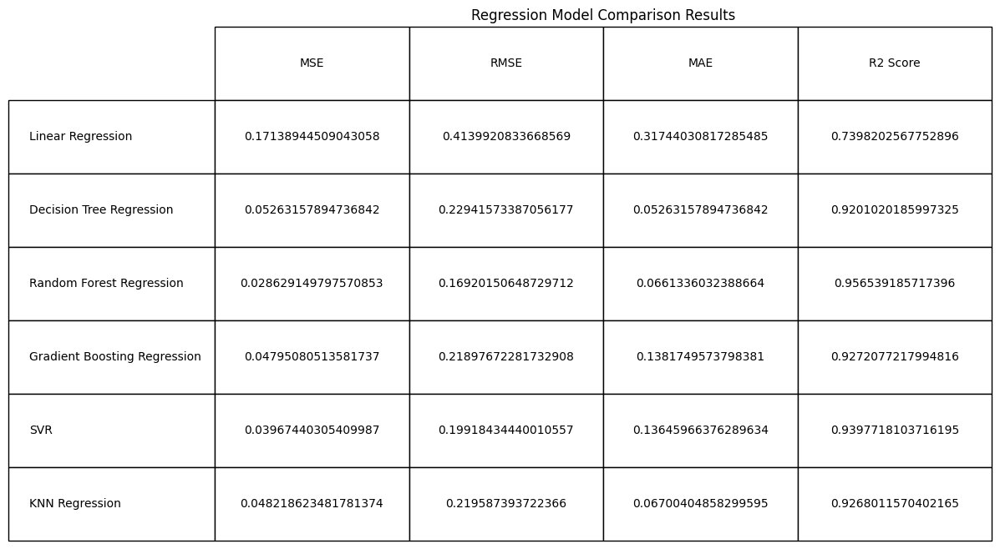

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regression': DecisionTreeRegressor(),
    'Random Forest Regression': RandomForestRegressor(),
    'Gradient Boosting Regression': GradientBoostingRegressor(),
    'SVR': SVR(),
    'KNN Regression': KNeighborsRegressor(),
}

# Initialize a dictionary to store results for each model
model_results = {}

# Fit models and store results
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Calculate metrics
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Store results in the dictionary
    model_results[model_name] = {
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'R2 Score': r2
    }

# Create a DataFrame to store all metrics for comparison
df_results = pd.DataFrame(model_results).T  # Transpose so that models are rows and metrics are columns

# Determine the best model based on R² Score (or any other metric)
best_model = df_results['R2 Score'].idxmax()  # Assuming R2 Score is in the results
best_model_metrics = df_results.loc[best_model]

# Print the best model and its metrics
print(f"The best regression model is: {best_model}")
print("Performance metrics:")
for metric_name, value in best_model_metrics.items():
    print(f"{metric_name}: {value}")

# Plot and save the results table as a figure
fig, ax = plt.subplots(figsize=(12, 8))  # Set the size of the figure
ax.axis('off')  # Hide the axes

# Create a table
table = ax.table(cellText=df_results.values,
                 rowLabels=df_results.index,
                 colLabels=df_results.columns,
                 cellLoc='center',
                 loc='center',
                 bbox=[0, 0, 1, 1])

# Set the title of the plot
plt.title('Regression Model Comparison Results')

# Save the plot as a JPG file
plt.savefig('Regression_Comparison_Results_SMOTE.jpg', format='jpg', bbox_inches='tight')

# Show the plot
plt.show()


## Classification LIME Code

c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


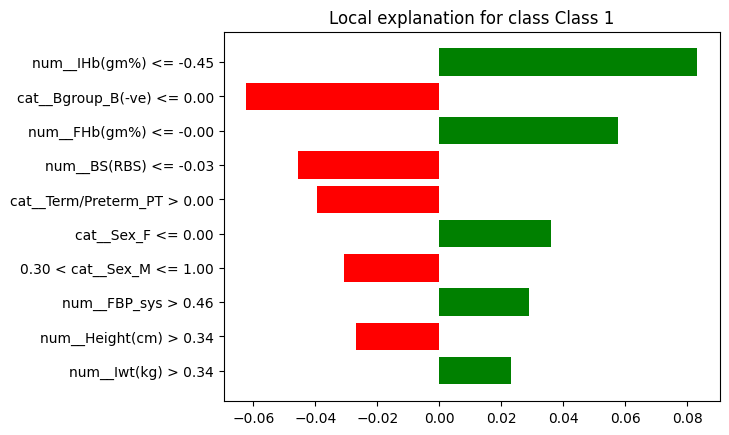

In [28]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Initialize and train the Random Forest model
rf_model_smote = RandomForestClassifier(n_jobs=-1, class_weight='balanced', random_state=42)
rf_model_smote.fit(X_train_smote, y_train_smote)

# Create a LimeTabularExplainer
explainer = LimeTabularExplainer(
    training_data=X_train_smote.values,
    feature_names=X.columns,
    class_names=['Class 0', 'Class 1'],  # Update these according to your classes
    mode='classification'  # Change to 'regression' if your target is continuous
)

# Choose an instance to explain from the test set
instance_index = 0  # Change this index to explain different instances
instance = X_test.iloc[instance_index].values.reshape(1, -1)

# Get the prediction for the instance
prediction = rf_model_smote.predict(instance)

# Explain the instance
explanation = explainer.explain_instance(
    data_row=instance[0],
    predict_fn=rf_model_smote.predict_proba
)

# Display the explanation
explanation.show_in_notebook(show_table=True)

# Optionally, plot the explanation
fig = explanation.as_pyplot_figure()
plt.show()


c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


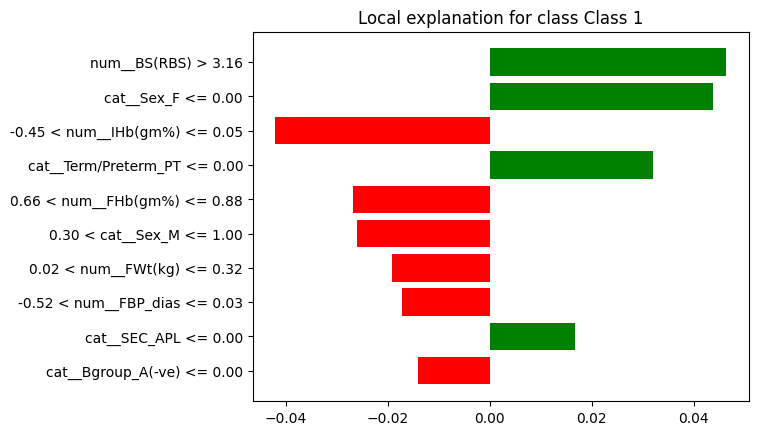

In [29]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Initialize and train the Random Forest model
rf_model_smote = RandomForestClassifier(n_jobs=-1, class_weight='balanced', random_state=42)
rf_model_smote.fit(X_train_smote, y_train_smote)

# Create a LimeTabularExplainer
explainer = LimeTabularExplainer(
    training_data=X_train_smote.values,
    feature_names=X.columns,
    class_names=['Class 0', 'Class 1'],  # Update these according to your classes
    mode='classification'  # Change to 'regression' if your target is continuous
)

# Choose an instance to explain from the test set
instance_index = 1  # Change this index to explain different instances
instance = X_test.iloc[instance_index].values.reshape(1, -1)

# Get the prediction for the instance
prediction = rf_model_smote.predict(instance)

# Explain the instance
explanation = explainer.explain_instance(
    data_row=instance[0],
    predict_fn=rf_model_smote.predict_proba
)

# Display the explanation
explanation.show_in_notebook(show_table=True)

# Optionally, plot the explanation
fig = explanation.as_pyplot_figure()
plt.show()


c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


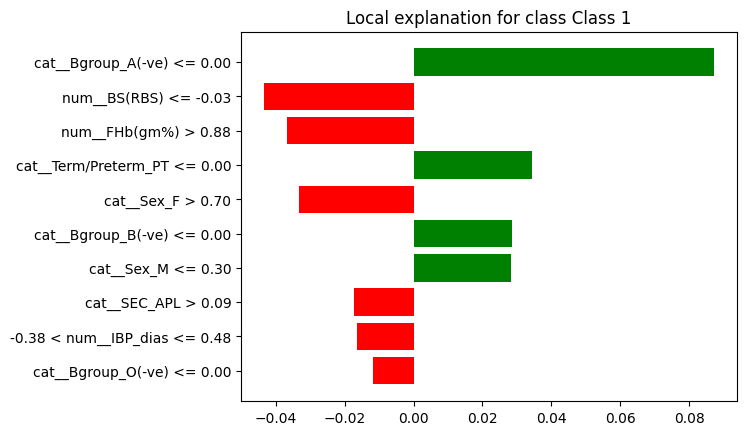

In [30]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Initialize and train the Random Forest model
rf_model_smote = RandomForestClassifier(n_jobs=-1, class_weight='balanced', random_state=42)
rf_model_smote.fit(X_train_smote, y_train_smote)

# Create a LimeTabularExplainer
explainer = LimeTabularExplainer(
    training_data=X_train_smote.values,
    feature_names=X.columns,
    class_names=['Class 0', 'Class 1'],  # Update these according to your classes
    mode='classification'  # Change to 'regression' if your target is continuous
)

# Choose an instance to explain from the test set
instance_index = 2  # Change this index to explain different instances
instance = X_test.iloc[instance_index].values.reshape(1, -1)

# Get the prediction for the instance
prediction = rf_model_smote.predict(instance)

# Explain the instance
explanation = explainer.explain_instance(
    data_row=instance[0],
    predict_fn=rf_model_smote.predict_proba
)

# Display the explanation
explanation.show_in_notebook(show_table=True)

# Optionally, plot the explanation
fig = explanation.as_pyplot_figure()
plt.show()

## Regression LIME Code

c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


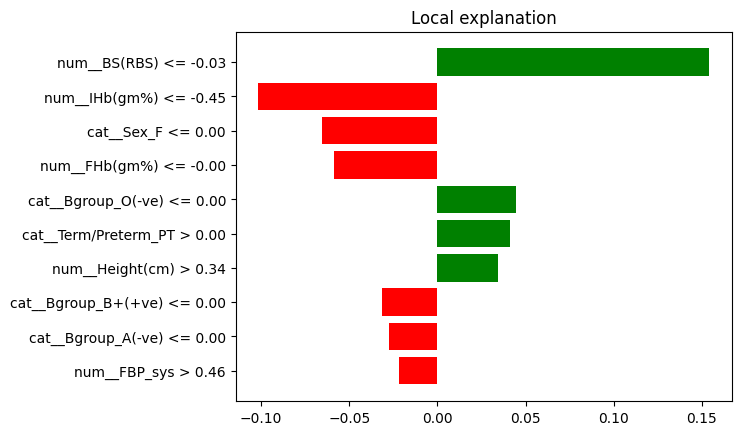

In [31]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Initialize and train the Random Forest model
rf_model_smote = RandomForestClassifier(n_jobs=-1, class_weight='balanced', random_state=42)
rf_model_smote.fit(X_train_smote, y_train_smote)

# Create a LimeTabularExplainer
explainer = LimeTabularExplainer(
    training_data=X_train_smote.values,
    feature_names=X.columns,
    class_names=['Class 0', 'Class 1'],  # Update these according to your classes
    mode='regression'  # Change to 'regression' if your target is continuous
)

# Choose an instance to explain from the test set
instance_index = 0  # Change this index to explain different instances
instance = X_test.iloc[instance_index].values.reshape(1, -1)

# Get the prediction for the instance
prediction = rf_model_smote.predict(instance)

# Explain the instance
explanation = explainer.explain_instance(
    data_row=instance[0],
    predict_fn=rf_model_smote.predict_proba
)

# Display the explanation
explanation.show_in_notebook(show_table=True)

# Optionally, plot the explanation
fig = explanation.as_pyplot_figure()
plt.show()


c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


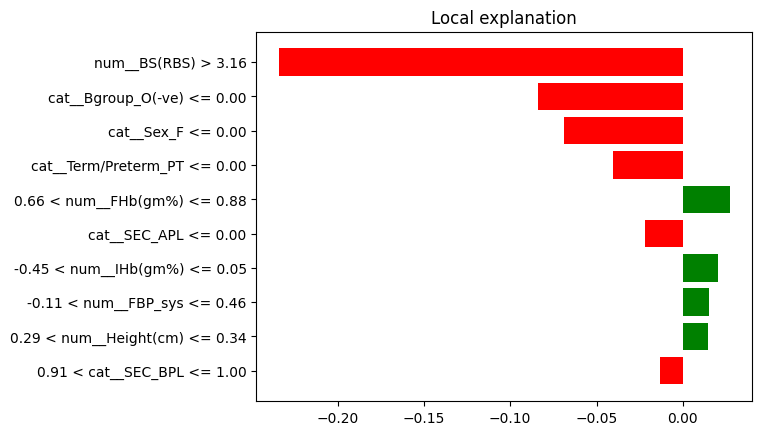

In [32]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Initialize and train the Random Forest model
rf_model_smote = RandomForestClassifier(n_jobs=-1, class_weight='balanced', random_state=42)
rf_model_smote.fit(X_train_smote, y_train_smote)

# Create a LimeTabularExplainer
explainer = LimeTabularExplainer(
    training_data=X_train_smote.values,
    feature_names=X.columns,
    class_names=['Class 0', 'Class 1'],  # Update these according to your classes
    mode='regression'  # Change to 'regression' if your target is continuous
)

# Choose an instance to explain from the test set
instance_index = 1  # Change this index to explain different instances
instance = X_test.iloc[instance_index].values.reshape(1, -1)

# Get the prediction for the instance
prediction = rf_model_smote.predict(instance)

# Explain the instance
explanation = explainer.explain_instance(
    data_row=instance[0],
    predict_fn=rf_model_smote.predict_proba
)

# Display the explanation
explanation.show_in_notebook(show_table=True)

# Optionally, plot the explanation
fig = explanation.as_pyplot_figure()
plt.show()

c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


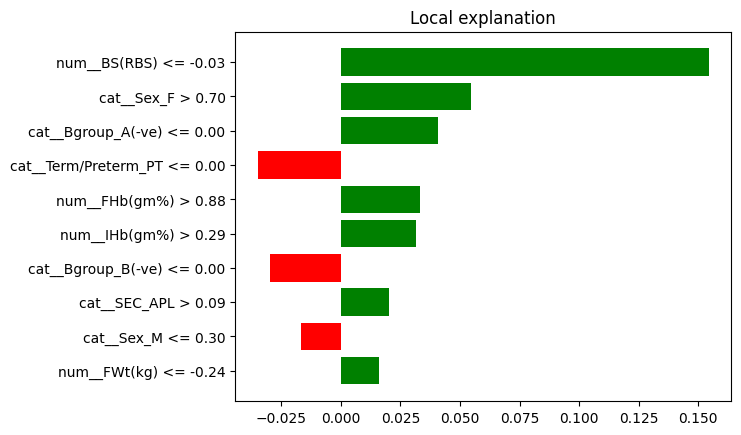

In [33]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Initialize and train the Random Forest model
rf_model_smote = RandomForestClassifier(n_jobs=-1, class_weight='balanced', random_state=42)
rf_model_smote.fit(X_train_smote, y_train_smote)

# Create a LimeTabularExplainer
explainer = LimeTabularExplainer(
    training_data=X_train_smote.values,
    feature_names=X.columns,
    class_names=['Class 0', 'Class 1'],  # Update these according to your classes
    mode='regression'  # Change to 'regression' if your target is continuous
)

# Choose an instance to explain from the test set
instance_index = 2  # Change this index to explain different instances
instance = X_test.iloc[instance_index].values.reshape(1, -1)

# Get the prediction for the instance
prediction = rf_model_smote.predict(instance)

# Explain the instance
explanation = explainer.explain_instance(
    data_row=instance[0],
    predict_fn=rf_model_smote.predict_proba
)

# Display the explanation
explanation.show_in_notebook(show_table=True)

# Optionally, plot the explanation
fig = explanation.as_pyplot_figure()
plt.show()


c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Selected Features: ['num__Age(years)', 'num__BS(RBS)', 'num__FHb(gm%)', 'num__FWt(kg)', 'num__Height(cm)', 'num__IHb(gm%)', 'num__Iwt(kg)', 'num__Parity', 'cat__Sex_F', 'cat__Sex_M']

Random Forest Classification Metrics
Accuracy: 0.9686234817813765
Confusion Matrix:
[[291  18   0]
 [ 13 323   0]
 [  0   0 343]]
Classification Report:
              precision    recall  f1-score   support

         1.0       0.96      0.94      0.95       309
         2.0       0.95      0.96      0.95       336
         3.0       1.00      1.00      1.00       343

    accuracy                           0.97       988
   macro avg       0.97      0.97      0.97       988
weighted avg       0.97      0.97      0.97       988



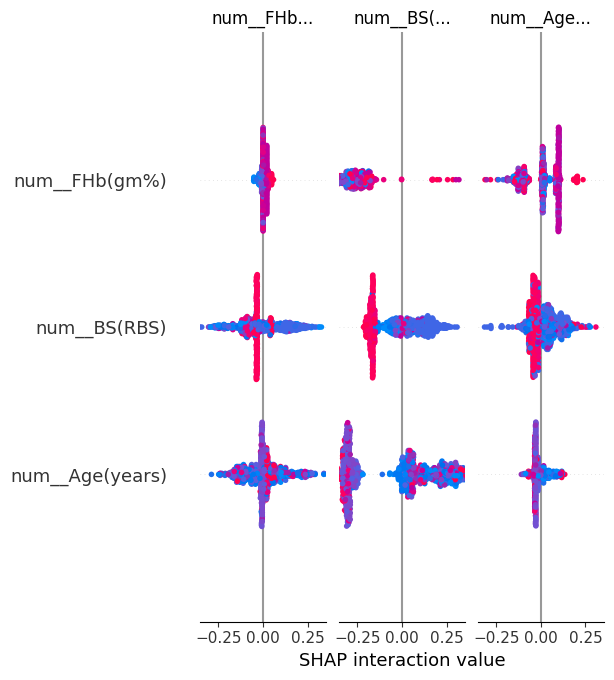

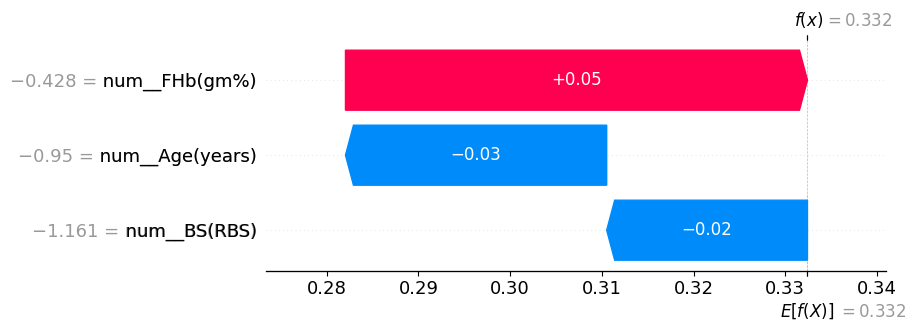

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import shap

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
target_column = 'LNH'  # Replace with your actual target column
X = df.drop(columns=[target_column])
y = df[target_column]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and fit the Random Forest model for RFE
rf_model_rfe = RandomForestClassifier(random_state=42)
rfe = RFE(estimator=rf_model_rfe, n_features_to_select=10)  # Select the top 10 features
rfe.fit(X_train, y_train)

# Get the selected features (based on RFE)
selected_features = X.columns[rfe.support_]
print("Selected Features:", selected_features.tolist())

# Transform the datasets to use only the selected features
X_train_rfe = rfe.transform(X_train)
X_test_rfe = rfe.transform(X_test)

# Initialize and train the Random Forest Classification model using the selected features
rf_model_smote = RandomForestClassifier(random_state=42)
rf_model_smote.fit(X_train_rfe, y_train)

# Make predictions on the test set
y_pred_rf = rf_model_smote.predict(X_test_rfe)

# Evaluate the Random Forest model
print("\nRandom Forest Classification Metrics")
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))
print("Classification Report:")
print(classification_report(y_test, y_pred_rf))

# SHAP Analysis
explainer = shap.TreeExplainer(rf_model_smote)
shap_values = explainer.shap_values(X_test_rfe)

# SHAP Summary Plot for the selected features
shap.summary_plot(shap_values, X_test_rfe, feature_names=selected_features)

# SHAP Waterfall plot for a specific instance
sample_index = 0  # Change this index to visualize different instances
explanation = shap.Explanation(
    values=shap_values[1][sample_index],  # Use [1] for binary classification class
    base_values=explainer.expected_value[1],
    data=X_test_rfe[sample_index],
    feature_names=selected_features.tolist()
)

# Create the waterfall plot
shap.plots.waterfall(explanation)

plt.show()



Random Forest Regression Metrics
Mean Squared Error: 0.03227813765182186
Root Mean Squared Error: 0.17966117458099248
Mean Absolute Error: 0.06941295546558705
R^2 Score: 0.9509997972069298


c:\Users\durup_d9ntfgd\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


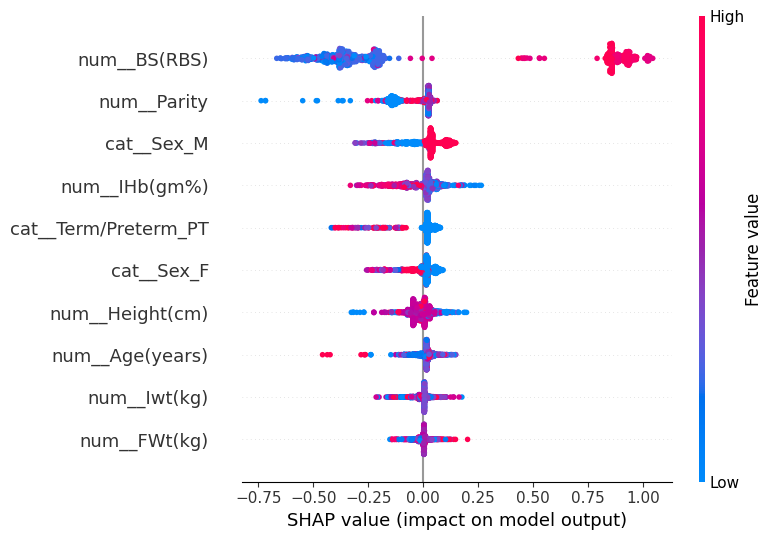

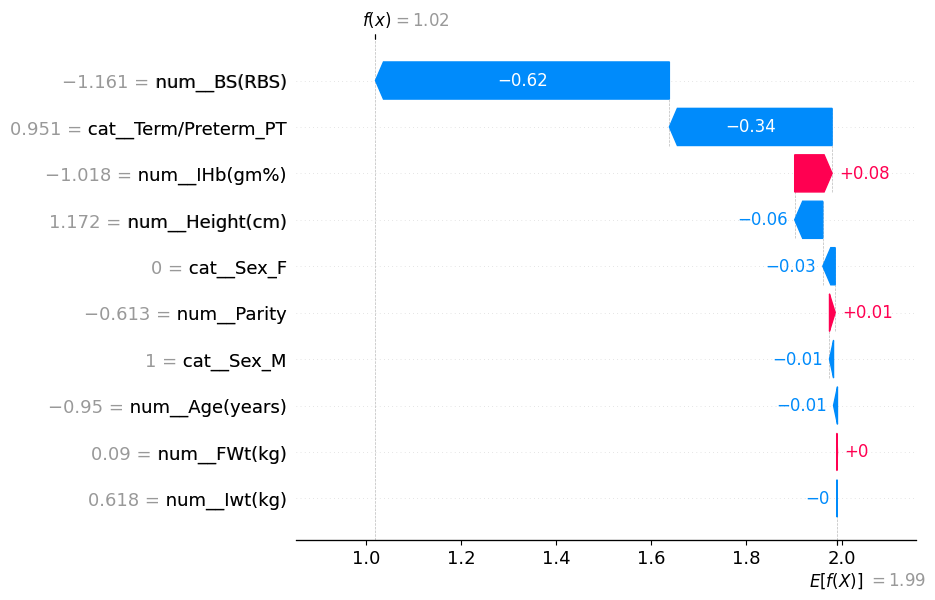

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import shap

# Load the dataset
df = pd.read_csv('Optimized_Predicting_Child_Birth_Weight_SMOTE.csv')

# Split data into features (X) and target (y)
X = df.drop(columns=['LNH'])  # Replace 'LNH' with your target column
y = df['LNH']  # Your target column

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and fit the Random Forest model for RFE
rf_reg_rfe = RandomForestRegressor(random_state=42)
rfe = RFE(estimator=rf_reg_rfe, n_features_to_select=10)  # Select the top 10 features
rfe.fit(X_train, y_train)

# Transform the datasets to use only the selected features
X_train_rfe = rfe.transform(X_train)
X_test_rfe = rfe.transform(X_test)

# Initialize and train the Random Forest Regression model using the selected features
rf_reg_smote = RandomForestRegressor(random_state=42)
rf_reg_smote.fit(X_train_rfe, y_train)

# Make predictions on the test set
y_pred_rf = rf_reg_smote.predict(X_test_rfe)

# Evaluate the Random Forest model
print("\nRandom Forest Regression Metrics")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred_rf))
print("Root Mean Squared Error:", mean_squared_error(y_test, y_pred_rf, squared=False))
print("Mean Absolute Error:", mean_absolute_error(y_test, y_pred_rf))
print("R^2 Score:", r2_score(y_test, y_pred_rf))

# SHAP Analysis
explainer = shap.TreeExplainer(rf_reg_smote)
shap_values = explainer.shap_values(X_test_rfe)

# SHAP Summary Plot for the selected features
shap.summary_plot(shap_values, X_test_rfe, feature_names=X.columns[rfe.support_])

# Waterfall plot for a specific instance
sample_index = 0  # Change this index to visualize different instances
explanation = shap.Explanation(
    values=shap_values[sample_index],
    base_values=explainer.expected_value,
    data=X_test_rfe[sample_index],
    feature_names=X.columns[rfe.support_].tolist()
)

# Create the waterfall plot
shap.plots.waterfall(explanation)

plt.show()
